# DPS Experiment: Base vs Fine-Tuned Architect (6 Variants)

**Experiment**: Compare base SDXL Turbo vs fine-tuned U-Net for scribble generation,
with and without DPS CLIP-MMD guidance, and with/without text prompting.

| # | Variant | U-Net | Prompt | DPS |
|---|---------|-------|--------|-----|
| 1 | `base_prompt_regular` | Base SDXL Turbo | scribble prompt + CFG 7.5 | No |
| 2 | `base_prompt_dps` | Base SDXL Turbo | scribble prompt + CFG 7.5 | Yes |
| 3 | `ft_prompt_regular` | Fine-tuned | scribble prompt + CFG 7.5 | No |
| 4 | `ft_prompt_dps` | Fine-tuned | scribble prompt + CFG 7.5 | Yes |
| 5 | `ft_noprompt_regular` | Fine-tuned | none (unconditional) | No |
| 6 | `ft_noprompt_dps` | Fine-tuned | none (unconditional) | Yes |

**Pipeline**: Source face → HED scribble → VAE encode → add noise → denoise (30 steps) → denoised scribble → ControlNet sprinter → 10 portrait photos

**Strengths tested**: 0.25, 0.5, 0.75 (fraction of noise added)

In [1]:
import json
from pathlib import Path
from IPython.display import display, HTML
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

ROOT = Path(".")
with open(ROOT / "metrics.json") as f:
    data = json.load(f)

FACES = 3
STRENGTHS = [0.25, 0.5, 0.75]
VARIANTS = [
    ("base_prompt_regular", "Base + prompt", "#888888"),
    ("base_prompt_dps",     "Base + prompt + DPS", "#2196F3"),
    ("ft_prompt_regular",   "FT + prompt", "#4CAF50"),
    ("ft_prompt_dps",       "FT + prompt + DPS", "#1B5E20"),
    ("ft_noprompt_regular", "FT unconditional", "#FF9800"),
    ("ft_noprompt_dps",     "FT unconditional + DPS", "#F44336"),
]

def show_img(path, ax=None, title=None):
    img = Image.open(path)
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(3, 3))
    ax.imshow(img)
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=9)
    return ax

print(f"Experiment config: {json.dumps(data['args'], indent=2)}")

Experiment config: {
  "output_dir": "SD_cond_SD_controlnet/output/dps_ft_44236635",
  "architect_unet_path": "finetune_scribble/output/final/merged",
  "wandb_project": "dps_experiment_final_ft",
  "wandb_entity": "conditional-matching",
  "n_faces": 3,
  "strengths": "0.25,0.5,0.75",
  "n_steps": 30,
  "num_variations": 20,
  "num_conditioned": 10,
  "base_zeta": 0.2,
  "guidance_scale": 7.5,
  "controlnet_scale": 0.5,
  "seed": 42,
  "prompt": "rough pencil scribble outline, loose sketch, minimal",
  "negative_prompt": "detailed, realistic, photograph, complex, colored, shading",
  "n_targets": 20
}


## 1. Conditioning Setup
The conditioning face (generated from oval via sprinter) and its inverted HED outline used for all ControlNet calls.

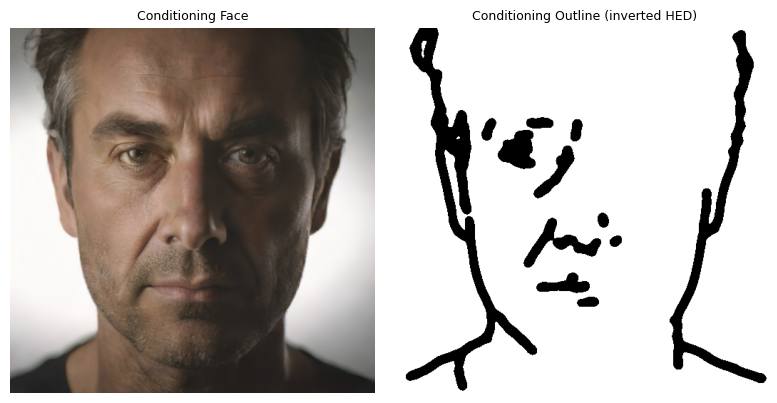

In [2]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
show_img(ROOT / "conditioning_face.png", axes[0], "Conditioning Face")
show_img(ROOT / "conditioning_outline.png", axes[1], "Conditioning Outline (inverted HED)")
plt.tight_layout()
plt.show()

## 2. Target Distribution
20 target portraits (10 male + 10 female) generated via sprinter, conditioned on the face outline.

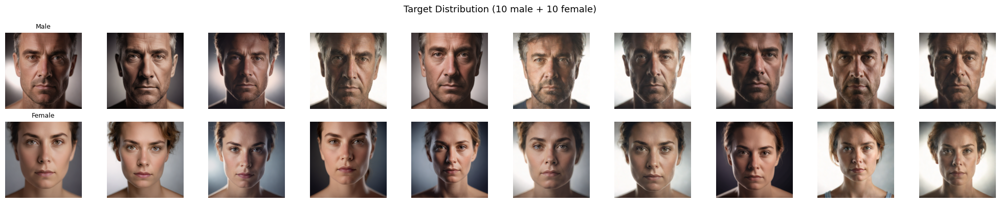

In [3]:
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
for i in range(20):
    r, c = i // 10, i % 10
    show_img(ROOT / f"targets/target_{i:02d}.png", axes[r, c])
    if i == 0:
        axes[r, c].set_title("Male", fontsize=9)
    elif i == 10:
        axes[r, c].set_title("Female", fontsize=9)
plt.suptitle("Target Distribution (10 male + 10 female)", fontsize=13)
plt.tight_layout()
plt.show()

## 3. Per-Face Results

For each face: source portrait → HED scribble → noised → 6 denoising variants × 3 strengths.

Each denoised scribble is then used to generate 10 conditioned portrait photos.

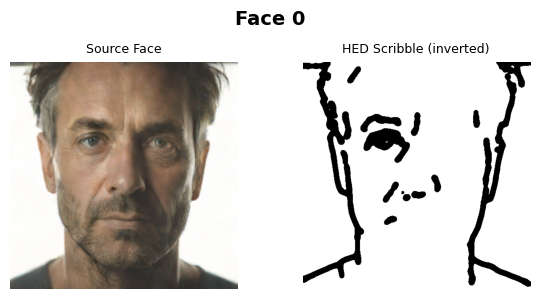

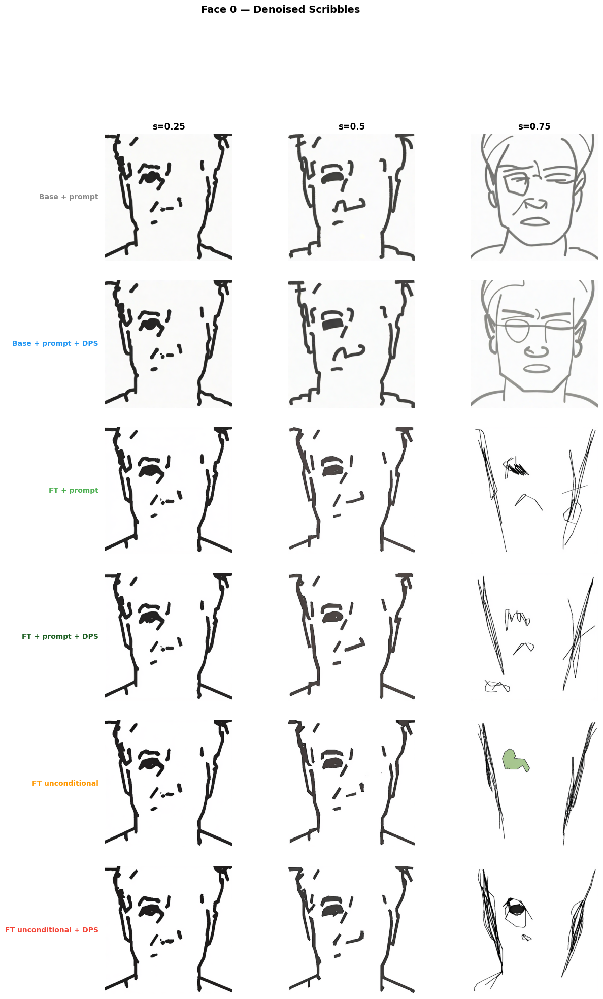

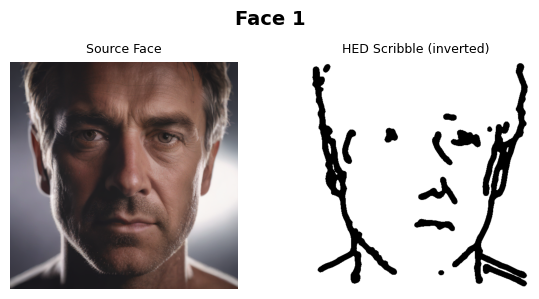

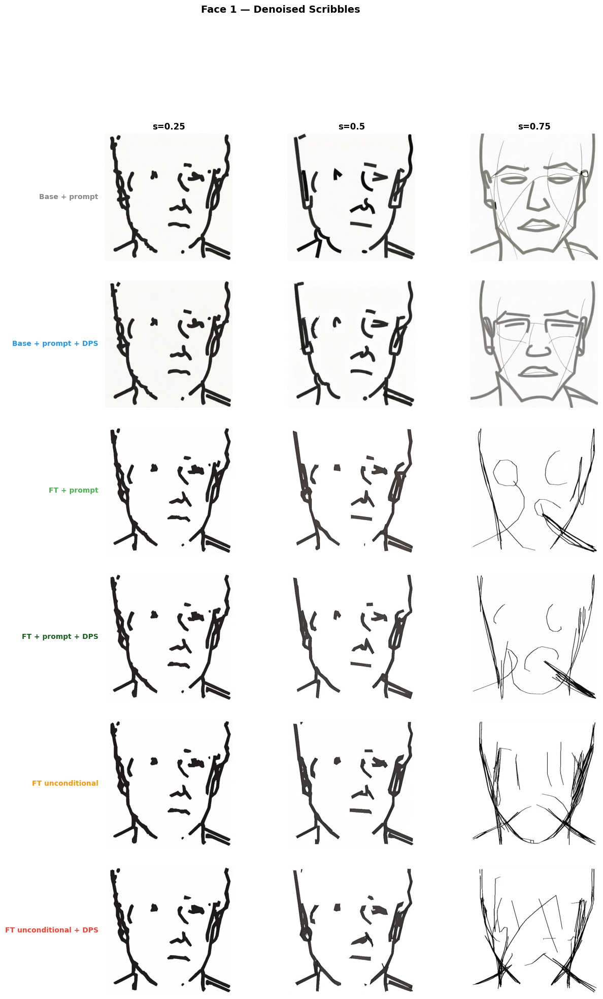

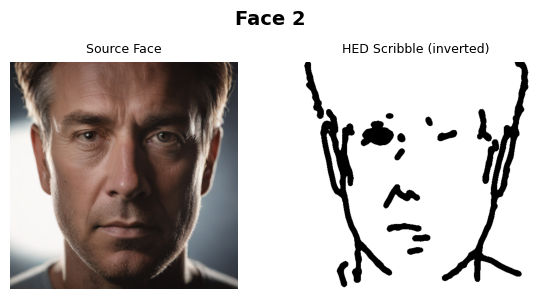

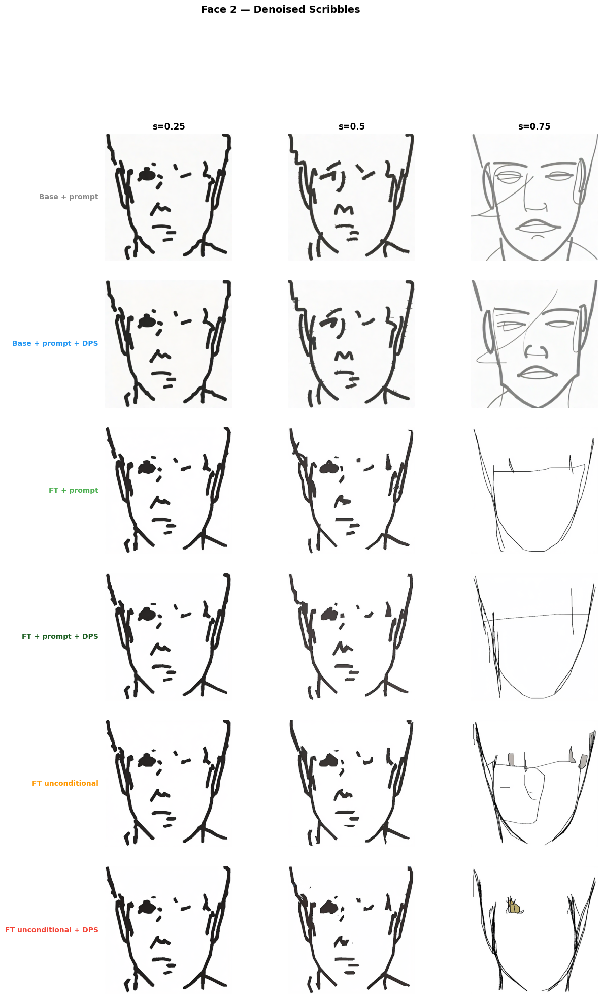

In [4]:
for face_idx in range(FACES):
    face_dir = ROOT / f"face_{face_idx}"
    
    # --- Source and scribble ---
    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
    show_img(face_dir / "source.png", axes[0], "Source Face")
    show_img(face_dir / "scribble.png", axes[1], "HED Scribble (inverted)")
    fig.suptitle(f"Face {face_idx}", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()
    
    # --- Denoised scribbles grid: 6 variants × 3 strengths ---
    fig = plt.figure(figsize=(14, 22))
    # Use gridspec with left margin for labels
    gs = fig.add_gridspec(len(VARIANTS), len(STRENGTHS), left=0.22, right=0.98, 
                          hspace=0.15, wspace=0.05)
    
    for v_idx, (vname, vlabel, vcolor) in enumerate(VARIANTS):
        for s_idx, s in enumerate(STRENGTHS):
            ax = fig.add_subplot(gs[v_idx, s_idx])
            img_path = face_dir / f"s{s}_{vname}.png"
            show_img(img_path, ax)
            if v_idx == 0:
                ax.set_title(f"s={s}", fontsize=12, fontweight="bold")
            # Row label on the left side
            if s_idx == 0:
                ax.text(-0.05, 0.5, vlabel, transform=ax.transAxes,
                        fontsize=10, color=vcolor, fontweight="bold",
                        ha="right", va="center")
    
    fig.suptitle(f"Face {face_idx} — Denoised Scribbles", fontsize=14, fontweight="bold", y=0.995)
    plt.show()

## 4. Conditioned Photos

For each variant × strength, 10 portrait photos were generated from the denoised scribble via ControlNet sprinter.

Showing 5 sample photos per variant at strength=0.5 (middle ground).

In [ ]:
N_SHOW = 5
SHOW_STRENGTH = 0.5

for face_idx in range(FACES):
    face_dir = ROOT / f"face_{face_idx}"
    
    fig = plt.figure(figsize=(2.5 * (N_SHOW + 1), 2.5 * len(VARIANTS)))
    gs = fig.add_gridspec(len(VARIANTS), N_SHOW + 1, left=0.18, right=0.98,
                          hspace=0.12, wspace=0.05)
    
    for v_idx, (vname, vlabel, vcolor) in enumerate(VARIANTS):
        # Denoised scribble in first column
        ax = fig.add_subplot(gs[v_idx, 0])
        show_img(face_dir / f"s{SHOW_STRENGTH}_{vname}.png", ax)
        ax.text(-0.05, 0.5, vlabel, transform=ax.transAxes,
                fontsize=8, color=vcolor, fontweight="bold",
                ha="right", va="center")
        if v_idx == 0:
            ax.set_title("Scribble", fontsize=9)
        
        # Conditioned photos
        photo_dir = face_dir / f"s{SHOW_STRENGTH}_{vname}_photos"
        for p_idx in range(N_SHOW):
            ax = fig.add_subplot(gs[v_idx, p_idx + 1])
            show_img(photo_dir / f"photo_{p_idx:02d}.png", ax)
            if v_idx == 0:
                ax.set_title(f"Photo {p_idx}", fontsize=9)
    
    fig.suptitle(f"Face {face_idx} — Conditioned Photos (strength={SHOW_STRENGTH})",
                 fontsize=14, fontweight="bold", y=1.0)
    plt.show()

## 5. Full Composites (from experiment)

These are the auto-generated composite images showing all variants and strengths per face.

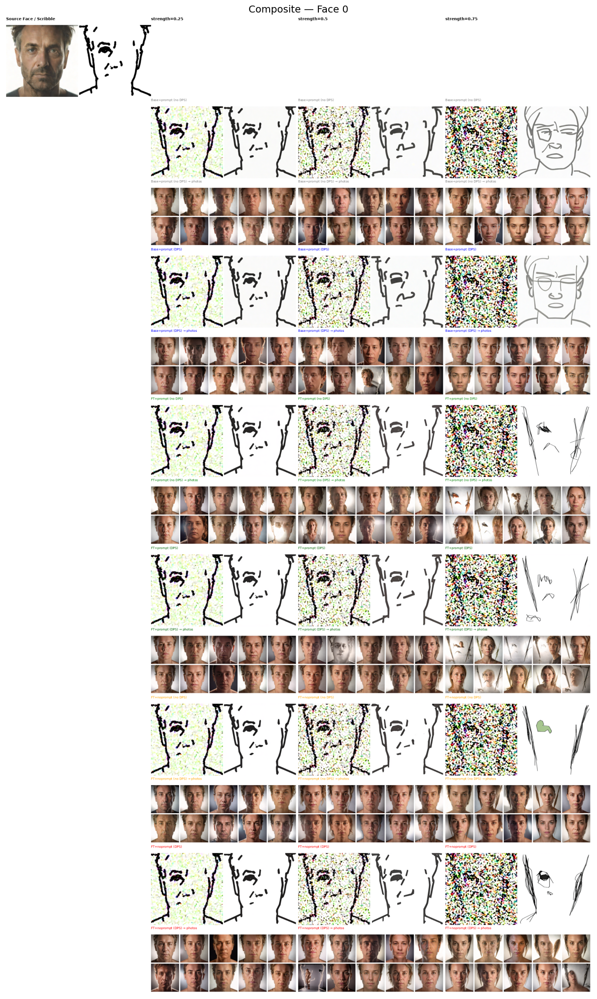

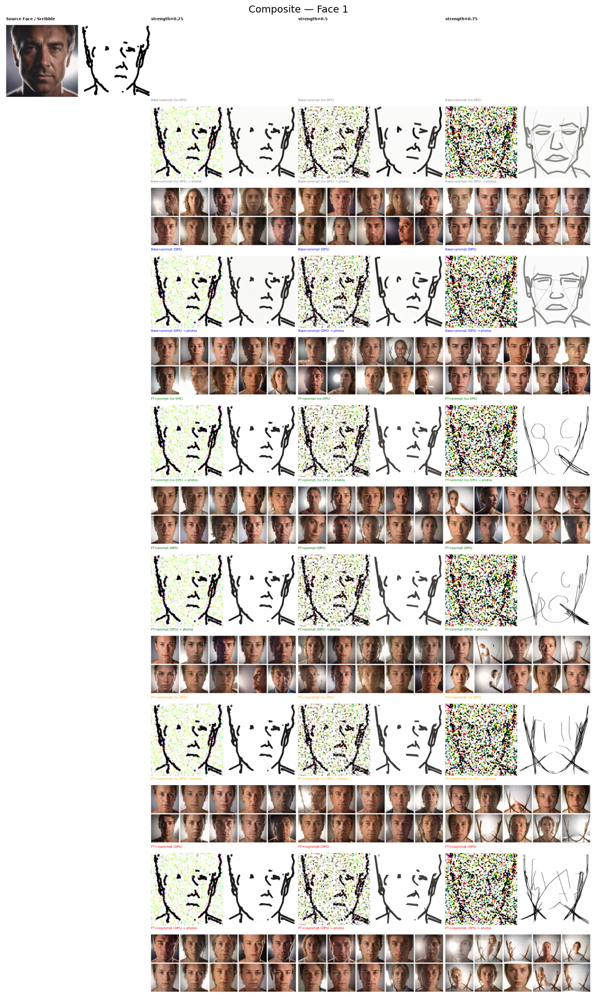

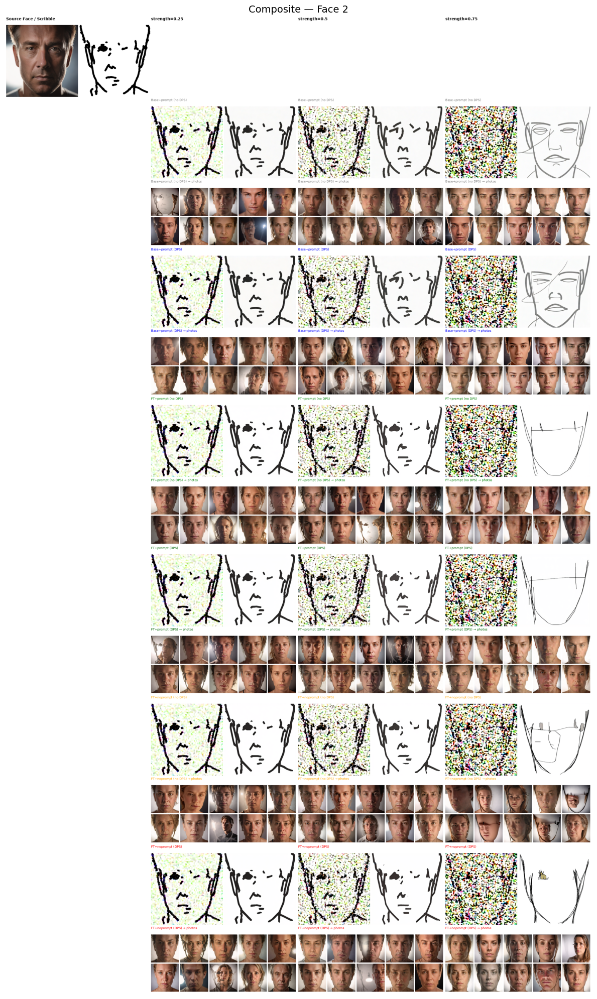

In [6]:
for face_idx in range(FACES):
    comp_path = ROOT / f"composites/composite_face_{face_idx}.png"
    img = Image.open(comp_path)
    w, h = img.size
    fig, ax = plt.subplots(1, 1, figsize=(min(w/80, 30), min(h/80, 20)))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Composite — Face {face_idx}", fontsize=14)
    plt.tight_layout()
    plt.show()

## 6. DPS Guidance Metrics

MMD loss and gradient norms across denoising steps for all DPS variants.

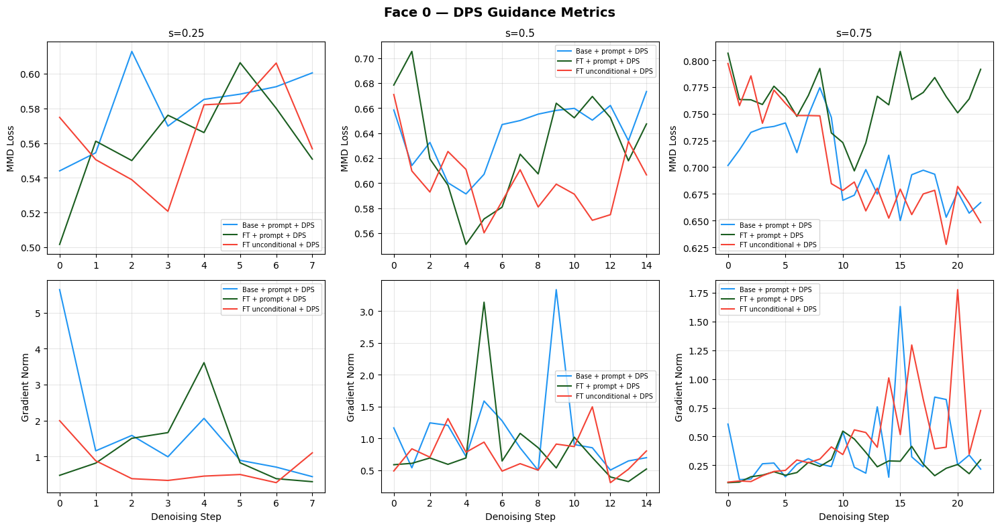

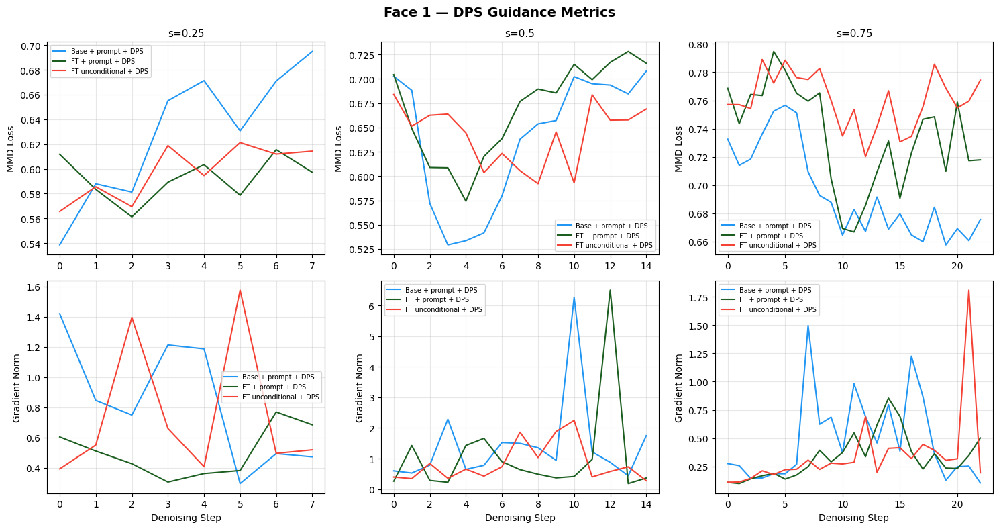

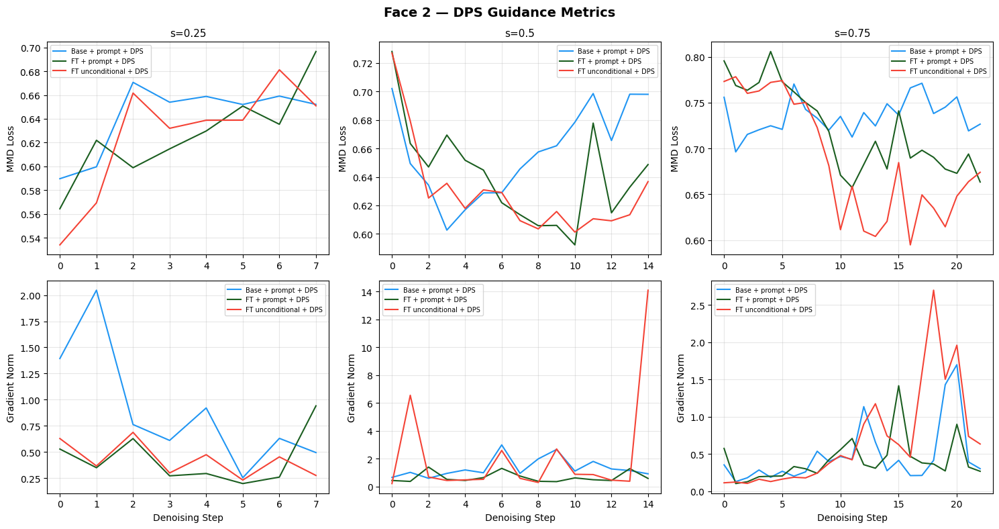

In [7]:
dps_variants = [v for v, _, _ in VARIANTS if "dps" in v]
dps_colors = {v: c for v, _, c in VARIANTS if "dps" in v}
dps_labels = {v: l for v, l, _ in VARIANTS if "dps" in v}

for face_idx in range(FACES):
    fig, axes = plt.subplots(2, len(STRENGTHS), figsize=(5*len(STRENGTHS), 8))
    
    for s_idx, s in enumerate(STRENGTHS):
        for vname in dps_variants:
            key = f"face{face_idx}_s{s}_{vname}"
            if key not in data["all_metrics"]:
                continue
            metrics = data["all_metrics"][key]
            steps = [m["step"] for m in metrics]
            mmd = [m["mmd_loss"] for m in metrics]
            grad = [m["gradient_norm"] for m in metrics]
            
            axes[0, s_idx].plot(steps, mmd, color=dps_colors[vname],
                               label=dps_labels[vname], linewidth=1.5)
            axes[1, s_idx].plot(steps, grad, color=dps_colors[vname],
                               label=dps_labels[vname], linewidth=1.5)
        
        axes[0, s_idx].set_title(f"s={s}", fontsize=11)
        axes[0, s_idx].set_ylabel("MMD Loss")
        axes[0, s_idx].legend(fontsize=7)
        axes[0, s_idx].grid(True, alpha=0.3)
        
        axes[1, s_idx].set_xlabel("Denoising Step")
        axes[1, s_idx].set_ylabel("Gradient Norm")
        axes[1, s_idx].legend(fontsize=7)
        axes[1, s_idx].grid(True, alpha=0.3)
    
    fig.suptitle(f"Face {face_idx} — DPS Guidance Metrics", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

## 7. Side-by-Side Comparison at Each Strength

Direct comparison of all 6 variants for a single face, one strength at a time.

In [ ]:
FOCUS_FACE = 0
face_dir = ROOT / f"face_{FOCUS_FACE}"

for s in STRENGTHS:
    fig = plt.figure(figsize=(13, 9))
    gs = fig.add_gridspec(2, 3, hspace=0.15, wspace=0.08)
    
    for v_idx, (vname, vlabel, vcolor) in enumerate(VARIANTS):
        r, c = v_idx // 3, v_idx % 3
        ax = fig.add_subplot(gs[r, c])
        show_img(face_dir / f"s{s}_{vname}.png", ax)
        ax.set_title(vlabel, fontsize=10, color=vcolor, fontweight="bold")
    
    fig.suptitle(f"Face {FOCUS_FACE} — All Variants at strength={s}",
                 fontsize=14, fontweight="bold")
    plt.show()

## 8. Summary Table — Average MMD per Variant

Average MMD loss (lower = closer to target distribution) across all steps, for DPS variants only.

In [9]:
print(f"{'Variant':<30} {'Strength':>8} {'Face':>4} {'Avg MMD':>10} {'Avg Grad':>10} {'Steps':>5}")
print("-" * 75)

for vname in dps_variants:
    for s in STRENGTHS:
        for face_idx in range(FACES):
            key = f"face{face_idx}_s{s}_{vname}"
            if key not in data["all_metrics"]:
                continue
            metrics = data["all_metrics"][key]
            avg_mmd = np.mean([m["mmd_loss"] for m in metrics])
            avg_grad = np.mean([m["gradient_norm"] for m in metrics])
            n_steps = len(metrics)
            label = dps_labels[vname]
            print(f"{label:<30} {s:>8} {face_idx:>4} {avg_mmd:>10.4f} {avg_grad:>10.4f} {n_steps:>5}")

Variant                        Strength Face    Avg MMD   Avg Grad Steps
---------------------------------------------------------------------------
Base + prompt + DPS                0.25    0     0.5809     1.6819     8
Base + prompt + DPS                0.25    1     0.6288     0.8352     8
Base + prompt + DPS                0.25    2     0.6420     0.8893     8
Base + prompt + DPS                 0.5    0     0.6395     1.0681    15
Base + prompt + DPS                 0.5    1     0.6386     1.4326    15
Base + prompt + DPS                 0.5    2     0.6578     1.3461    15
Base + prompt + DPS                0.75    0     0.7028     0.3969    23
Base + prompt + DPS                0.75    1     0.6947     0.4849    23
Base + prompt + DPS                0.75    2     0.7355     0.4700    23
FT + prompt + DPS                  0.25    0     0.5615     1.1949     8
FT + prompt + DPS                  0.25    1     0.5925     0.5063     8
FT + prompt + DPS                  0.25    2    